In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

from shapely.geometry import Point
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
hub_nash=pd.read_csv('../data/hub_requests.csv')

/Users/nicolemuldowney/opt/anaconda3/envs/geo/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
hub_nash.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,State Issue,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location
0,113016,Closed,"Trash, Recycling & Litter",Cart Service,Trash - Request an Additional Cart,10/30/2018 01:47:00 PM,03/05/2019 09:35:00 PM,Phone,NaN,NaN,...,False,NaN,False,2009 Upland Dr,NASHVILLE,7.0,37216,36.198638,-86.706659,"(36.1986378, -86.7066586)"
1,126185,Closed,"Streets, Roads & Sidewalks",Blocking the Right of Way,NaN,12/28/2018 01:04:00 PM,12/28/2018 01:04:00 PM,Phone,OE-00040610_12/27/2018 15:44,NaN,...,False,NaN,True,ELM HILL PKE / DONELSON PKE,NASHVILLE,15.0,37214,36.148809,-86.666282,"(36.14880891, -86.6662816)"
2,119344,Closed,"Trash, Recycling & Litter",Damage to Property,Trash Service,11/27/2018 02:20:00 PM,11/29/2018 04:04:00 AM,Phone,NaN,NaN,...,False,NaN,True,"597 Westchester Dr, Nashville, TN 37115, Unite...",MADISON,8.0,37115,36.263020,-86.738630,"(36.26302, -86.73863)"
3,127752,Closed,"Trash, Recycling & Litter",New Service/Activate Service,New Construction Residential Recycle,01/03/2019 06:57:00 PM,01/09/2019 10:09:00 AM,Phone,NaN,NaN,...,False,NaN,False,Ruffian Way,NaN,NaN,NaN,38.097609,-84.554097,"(38.0976091, -84.5540971)"
4,113477,Closed,"Trash, Recycling & Litter",Backdoor Trash or Recycle Waivers,Request Recycling Disability Waiver,10/31/2018 12:20:00 PM,10/31/2018 04:10:00 PM,Phone,NaN,NaN,...,False,NaN,True,"2326 Smith Springs Rd, Nashville, TN 37217, Un...",NASHVILLE,29.0,37217,36.096460,-86.637440,"(36.09646, -86.63744)"


In [4]:
hub_nash['Council District'].value_counts()

19.0    18781
21.0    15931
6.0     14541
17.0    13453
5.0     12846
24.0    11674
7.0     11331
20.0    11322
15.0    11011
2.0     10750
25.0    10295
16.0     9881
8.0      9558
33.0     8405
23.0     7858
29.0     7856
18.0     7808
1.0      7106
26.0     6721
28.0     6257
34.0     6066
30.0     5888
9.0      5845
3.0      5766
32.0     5508
27.0     5305
13.0     5154
31.0     4896
4.0      4598
14.0     4180
11.0     3745
12.0     2863
22.0     2628
35.0     2537
10.0     2210
Name: Council District, dtype: int64

In [5]:
hub_nash_drop=hub_nash.drop(columns= ['State Issue',
                                 'Preferred Language',
                                 'Mapped Location' ])

In [6]:
#hub_nash = hub_nash[["Council District", "Request Type"]]

In [7]:
hub_nash_drop.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude
0,113016,Closed,"Trash, Recycling & Litter",Cart Service,Trash - Request an Additional Cart,10/30/2018 01:47:00 PM,03/05/2019 09:35:00 PM,Phone,NaN,NaN,NaN,False,2009 Upland Dr,NASHVILLE,7.0,37216,36.198638,-86.706659
1,126185,Closed,"Streets, Roads & Sidewalks",Blocking the Right of Way,NaN,12/28/2018 01:04:00 PM,12/28/2018 01:04:00 PM,Phone,OE-00040610_12/27/2018 15:44,NaN,NaN,True,ELM HILL PKE / DONELSON PKE,NASHVILLE,15.0,37214,36.148809,-86.666282
2,119344,Closed,"Trash, Recycling & Litter",Damage to Property,Trash Service,11/27/2018 02:20:00 PM,11/29/2018 04:04:00 AM,Phone,NaN,NaN,NaN,True,"597 Westchester Dr, Nashville, TN 37115, Unite...",MADISON,8.0,37115,36.263020,-86.738630
3,127752,Closed,"Trash, Recycling & Litter",New Service/Activate Service,New Construction Residential Recycle,01/03/2019 06:57:00 PM,01/09/2019 10:09:00 AM,Phone,NaN,NaN,NaN,False,Ruffian Way,NaN,NaN,NaN,38.097609,-84.554097
4,113477,Closed,"Trash, Recycling & Litter",Backdoor Trash or Recycle Waivers,Request Recycling Disability Waiver,10/31/2018 12:20:00 PM,10/31/2018 04:10:00 PM,Phone,NaN,NaN,NaN,True,"2326 Smith Springs Rd, Nashville, TN 37217, Un...",NASHVILLE,29.0,37217,36.096460,-86.637440


In [8]:
clean_hub_nash=hub_nash_drop.dropna(subset=['Council District'])

In [9]:
council_count=clean_hub_nash['Council District'].value_counts()
council_count

19.0    18781
21.0    15931
6.0     14541
17.0    13453
5.0     12846
24.0    11674
7.0     11331
20.0    11322
15.0    11011
2.0     10750
25.0    10295
16.0     9881
8.0      9558
33.0     8405
23.0     7858
29.0     7856
18.0     7808
1.0      7106
26.0     6721
28.0     6257
34.0     6066
30.0     5888
9.0      5845
3.0      5766
32.0     5508
27.0     5305
13.0     5154
31.0     4896
4.0      4598
14.0     4180
11.0     3745
12.0     2863
22.0     2628
35.0     2537
10.0     2210
Name: Council District, dtype: int64

In [10]:
council_hub_nash=clean_hub_nash.groupby(['Council District']).count()
council_hub_nash.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,Parent Request,Closed When Created,Address,City,ZIP,Latitude,Longitude
Council District,,,,,,,,,,,,,,,,,
1.0,7106,7106,7105,7064,4330,7106,6882,7106,753,639,59,7106,7095,7103,7102,7097,7097
2.0,10750,10750,10749,10699,7261,10750,10421,10750,706,822,121,10750,10735,10746,10737,10739,10739
3.0,5766,5766,5765,5741,2779,5766,5565,5766,918,386,74,5766,5761,5762,5754,5762,5762
4.0,4598,4598,4582,4562,2857,4598,4482,4598,438,506,101,4598,4585,4597,4596,4595,4595
5.0,12846,12846,12844,12792,8593,12846,12383,12846,990,1048,204,12846,12827,12841,12838,12835,12835


-Request vs location (council district, has someone to push for resolution, an accountable person)
-How requests vary by council district - are there spikes in certain places or times, does that tell us if particular council members are pushing hub more actively than others?
-Break covid data out - look for trends by council district
-Look for trends in type of requests, does a particular district stand out for certain categories?

In [11]:
covid = clean_hub_nash.loc[clean_hub_nash['Request Type'] == 'COVID-19']
covid  #2689 rows

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude
1516,330630,Closed,COVID-19,NaN,NaN,03/22/2020 05:12:15 PM,03/23/2020 01:20:48 AM,hubNashville Community,NaN,NaN,NaN,False,1400 Rosa L Parks Blvd,NASHVILLE,19.0,37208,36.178773,-86.794311
4562,339424,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/04/2020 08:18:05 PM,04/09/2020 02:20:19 PM,hubNashville Community,NaN,NaN,NaN,False,800 Main St,NASHVILLE,6.0,37206,36.175009,-86.758545
4971,348304,Closed,COVID-19,COVID-19 Violations,NaN,04/17/2020 09:30:20 PM,04/21/2020 02:07:48 PM,hubNashville Community,NaN,NaN,NaN,False,130 LifeWay Plaza,NASHVILLE,19.0,37203,36.165020,-86.789680
24756,339754,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/06/2020 12:24:53 AM,04/13/2020 01:30:08 PM,hubNashville Community,NaN,NaN,NaN,False,5504 Old Hickory Blvd,HERMITAGE,12.0,37076,36.181192,-86.606674
28885,339739,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/05/2020 11:32:46 PM,04/13/2020 01:56:44 PM,hubNashville Community,NaN,NaN,NaN,False,301 14th Ave N,NASHVILLE,19.0,37203,36.159251,-86.793243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144615,364612,Closed,COVID-19,COVID-19 Questions,NaN,05/11/2020 08:45:37 PM,05/12/2020 01:18:57 PM,Phone,NaN,NaN,NaN,False,803 Ashlawn Pl,NASHVILLE,27.0,37211,36.049100,-86.741780
144619,364785,New,COVID-19,COVID-19 Violations,COVID-19 Violations,05/12/2020 03:09:47 AM,NaN,hubNashville Community,NaN,NaN,NaN,False,800 Monroe St,NASHVILLE,19.0,37208,36.175689,-86.794258
144630,364796,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,05/12/2020 04:13:48 AM,05/12/2020 05:00:58 PM,hubNashville Community,NaN,NaN,NaN,False,2215 N Gallatin Pike Rd,MADISON,10.0,37115,36.304419,-86.688173
144640,364714,New,COVID-19,COVID-19 Violations,COVID-19 Violations,05/11/2020 10:10:07 PM,NaN,hubNashville Community,NaN,NaN,NaN,False,2934 Sidco Dr,NASHVILLE,16.0,37204,36.107907,-86.755181


In [12]:
covid['Subrequest Type'].value_counts()

COVID-19 Violations                                           2508
COVID-19 Questions                                             174
COVID-19 - Submit Input about The Plan to Reopen Nashville       4
Name: Subrequest Type, dtype: int64

In [13]:
covid['Additional Subrequest Type'].value_counts()

COVID-19 Violations                                           2453
COVID-19 - Submit Input about The Plan to Reopen Nashville       3
Name: Additional Subrequest Type, dtype: int64

In [14]:
covid['Council District'].value_counts()

19.0    370
17.0    172
10.0    130
24.0    110
2.0     102
16.0    101
21.0    101
9.0     100
15.0     99
11.0     98
5.0      96
20.0     94
8.0      82
13.0     76
28.0     74
22.0     73
25.0     70
14.0     63
32.0     62
26.0     57
7.0      52
35.0     52
6.0      51
18.0     50
27.0     49
3.0      44
31.0     40
30.0     38
33.0     34
1.0      31
34.0     29
23.0     27
29.0     26
4.0      23
12.0     13
Name: Council District, dtype: int64

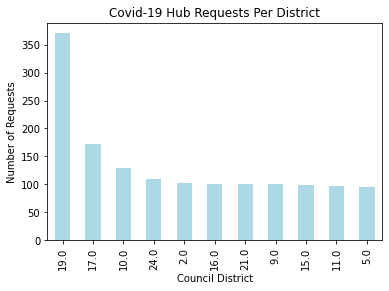

In [15]:
covid['Council District'].value_counts()[:5].plot(kind='bar',color='lightblue')
plt.ylabel('Number of Requests')
plt.xlabel('Council District')
plt.title('Covid-19 Hub Requests Per District'); 

In [16]:
covid['geometry'] = covid.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)
covid.head(3)

/Users/nicolemuldowney/opt/anaconda3/envs/geo/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,geometry
1516,330630,Closed,COVID-19,NaN,NaN,03/22/2020 05:12:15 PM,03/23/2020 01:20:48 AM,hubNashville Community,NaN,NaN,NaN,False,1400 Rosa L Parks Blvd,NASHVILLE,19.0,37208,36.178773,-86.794311,POINT (-86.79431099325409 36.1787729116136)
4562,339424,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/04/2020 08:18:05 PM,04/09/2020 02:20:19 PM,hubNashville Community,NaN,NaN,NaN,False,800 Main St,NASHVILLE,6.0,37206,36.175009,-86.758545,POINT (-86.75854459325407 36.175009161612)
4971,348304,Closed,COVID-19,COVID-19 Violations,NaN,04/17/2020 09:30:20 PM,04/21/2020 02:07:48 PM,hubNashville Community,NaN,NaN,NaN,False,130 LifeWay Plaza,NASHVILLE,19.0,37203,36.165020,-86.789680,POINT (-86.78968 36.16502)


In [17]:
nash_map = folium.Map(location =  [36.1612,-86.7775], zoom_start = 12)

#folium.GeoJson(polygon37207).add_to(map_37207)


for row_index, row_values in covid.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Request Type'])
    marker = folium.Marker(
        location = loc, 
        popup = pop,
        icon=folium.Icon(color='lightred', icon='hand-stop-o',prefix='fa')
    ) 
    marker.add_to(nash_map)
#nash_map.save('../maps/map37207.html')
nash_map

In [18]:
cluster_map_covid = folium.Map(location = [36.1612,-86.7775], zoom_start = 11)
marker_cluster = MarkerCluster().add_to(cluster_map_covid)
#folium.GeoJson(polygon_nashville).add_to(cluster_map_nash)

for row_index, row_values in covid.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = "Request Type: " + str(row_values['Request Type']) + " - Subrequest Type: " + str(row_values[ 'Subrequest Type']) + "- Additional Subrequest Type: " + str(row_values[ 'Additional Subrequest Type'])
    marker = folium.Marker(
        location = loc, 
        popup = '<strong>' + pop + '</strong>',
        icon=folium.Icon(color='lightred', icon='hand-stop-o',prefix='fa') )
    marker.add_to(marker_cluster)

#cluster_map_nash.save('../geospatial-explore/maps/clusternash.html')
cluster_map_covid  

In [19]:
districts = gpd.read_file('../data/district_outlines.geojson')
districts = districts[['council_district','geometry']]
print(districts.crs)
districts.head( )

epsg:4326


,council_district,geometry
0,1,"MULTIPOLYGON (((-86.90738 36.39052, -86.90725 ..."
1,2,"MULTIPOLYGON (((-86.75902 36.23091, -86.75909 ..."
2,3,"MULTIPOLYGON (((-86.76842 36.38358, -86.76824 ..."
3,4,"MULTIPOLYGON (((-86.74489 36.05316, -86.74491 ..."
4,5,"MULTIPOLYGON (((-86.74724 36.21041, -86.74243 ..."


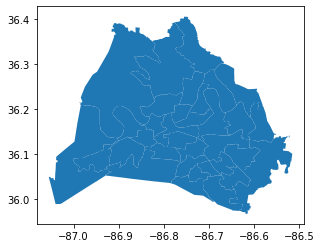

In [20]:
districts.plot()

In [21]:
districts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [22]:
covid_geo = gpd.GeoDataFrame(covid, 
                           crs = districts.crs, 
                           geometry = covid['geometry'])

In [23]:
covid_districts = gpd.sjoin(covid_geo, districts, op = 'within')
covid_districts.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,geometry,index_right,council_district
1516,330630,Closed,COVID-19,NaN,NaN,03/22/2020 05:12:15 PM,03/23/2020 01:20:48 AM,hubNashville Community,NaN,NaN,...,False,1400 Rosa L Parks Blvd,NASHVILLE,19.0,37208,36.178773,-86.794311,POINT (-86.79431 36.17877),18,19
4971,348304,Closed,COVID-19,COVID-19 Violations,NaN,04/17/2020 09:30:20 PM,04/21/2020 02:07:48 PM,hubNashville Community,NaN,NaN,...,False,130 LifeWay Plaza,NASHVILLE,19.0,37203,36.165020,-86.789680,POINT (-86.78968 36.16502),18,19
28885,339739,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/05/2020 11:32:46 PM,04/13/2020 01:56:44 PM,hubNashville Community,NaN,NaN,...,False,301 14th Ave N,NASHVILLE,19.0,37203,36.159251,-86.793243,POINT (-86.79324 36.15925),18,19
96895,348009,Closed,COVID-19,COVID-19 Violations,COVID-19 Violations,04/17/2020 04:51:54 PM,04/21/2020 02:03:14 PM,Phone,NaN,NaN,...,False,900 20th Ave S,NASHVILLE,19.0,37212,36.148540,-86.797310,POINT (-86.79731 36.14854),18,19
97129,330650,Closed,COVID-19,COVID-19 Questions,NaN,03/22/2020 05:30:36 PM,03/23/2020 10:44:28 PM,hubNashville Community,NaN,NaN,...,False,415A Spence Ln,NASHVILLE,19.0,37210,36.148170,-86.722620,POINT (-86.72262 36.14817),18,19


In [25]:
cluster_map_covid2 = folium.Map(location = [36.1612,-86.7775], zoom_start = 11)
folium.GeoJson(districts).add_to(cluster_map_covid2)
marker_cluster = MarkerCluster().add_to(cluster_map_covid2)

for row_index, row_values in covid_districts.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = "Council District: " + str(row_values['Council District'])
    marker = folium.Marker(
        location = loc, 
        popup = '<strong>' + pop + '</strong>',
        icon=folium.Icon(color='lightred', icon='hand-stop-o',prefix='fa'))
    marker.add_to(marker_cluster)

#cluster_map_nash.save('../geospatial-explore/maps/clusternash.html')
cluster_map_covid2
